In [149]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

import pathlib
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

def load_model(model_name):
    base_url = 'http://download.tensorflow.org/models/object_detection/'
    model_file = model_name + '.tar.gz'
    model_dir = tf.keras.utils.get_file(
      fname=model_name, 
      origin=base_url + model_file,
      untar=True)
    
    model_dir = pathlib.Path(model_dir)/"saved_model"
    
    model = tf.saved_model.load(str(model_dir))
    model = model.signatures['serving_default']
    
    return model

def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]
    
    # Run inference
    output_dict = model(input_tensor)
    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy() 
                   for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections
    
    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
    
    # Handle models with masks:
    if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                  output_dict['detection_masks'], output_dict['detection_boxes'],
                   image.shape[0], image.shape[1])      
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                           tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
      
    return output_dict

In [159]:
model_name = "mask_rcnn_inception_resnet_v2_atrous_coco_2018_01_28"
s2="ssd_mobilenet_v1_0.75_depth_300x300_coco14_sync_2018_07_03"
s3="faster_rcnn_inception_v2_coco_2018_01_28"
masking_model = load_model("faster_rcnn_inception_v2_coco_2018_01_28")

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [162]:
def show_inference(model, image_path,output_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
    name=str(image_path).split('/')[-1] 
    result_name=f"{output_path}/result_{name}"
    print(result_names)
    image_np = np.array(Image.open(image_path))
    # Actual detection.
    output_dict = run_inference_for_single_image(model, image_np)
    ###########
    output_dict2={}
    for i in output_dict.keys():
        print(f"ss",i,output_dict.get(i))
    if output_dict.get('num_detections')>0:
        if 1 in output_dict.get('detection_classes'):
            tmp=output_dict.get('detection_classes')
            human=[i for i in range(len(tmp)) if tmp[i]==1]
            #print (f"why",output_dict.get('detection_boxes').shape,[output_dict.get('detection_boxes')[i] for i in human].as_list())
            output_dict2['detection_boxes']= tf.constant([output_dict.get('detection_boxes')[i] for i in human]).numpy()
            output_dict2['detection_scores']=tf.constant([output_dict.get('detection_scores')[i] for i in human]).numpy()
            output_dict2['detection_classes']=tf.constant([output_dict.get('detection_classes')[i] for i in human]).numpy()
            output_dict2['num_detections']=len(human)
#             for i in output_dict.keys():
#                 print(f"see out_2", i,output_dict2.get(i))
#     # Visualization of the results of a detection.
            output_dict=output_dict2
   
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks_reframed', None),
        use_normalized_coordinates=True,
        line_thickness=8,
        min_score_thresh=0.3
    )
    
    final=Image.fromarray(image_np)
    final.save(result_name)
    display(final)

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']


['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores []
ss detection_classes []
ss detection_boxes []
ss num_detections 0


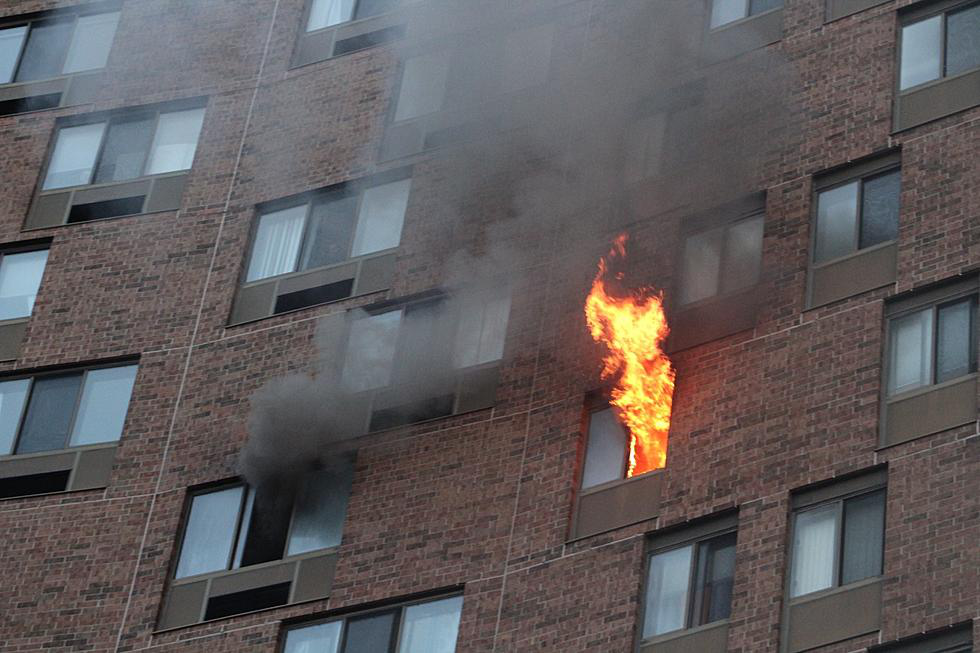

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores [0.78060234 0.71170914 0.70551986 0.56817615 0.44861236 0.40085468
 0.30463767]
ss detection_classes [1 7 1 7 7 1 1]
ss detection_boxes [[0.5468806  0.6890079  0.6322381  0.74324644]
 [0.43746105 0.         0.9438253  0.72211194]
 [0.55751354 0.7821727  0.6541257  0.8181472 ]
 [0.6199489  0.         0.9812643  0.73865086]
 [0.09925281 0.04393175 0.8526555  0.72951484]
 [0.5636166  0.864919   0.6554448  0.89420813]
 [0.5312737  0.8225811  0.6563852  0.85398954]]
ss num_detections 7


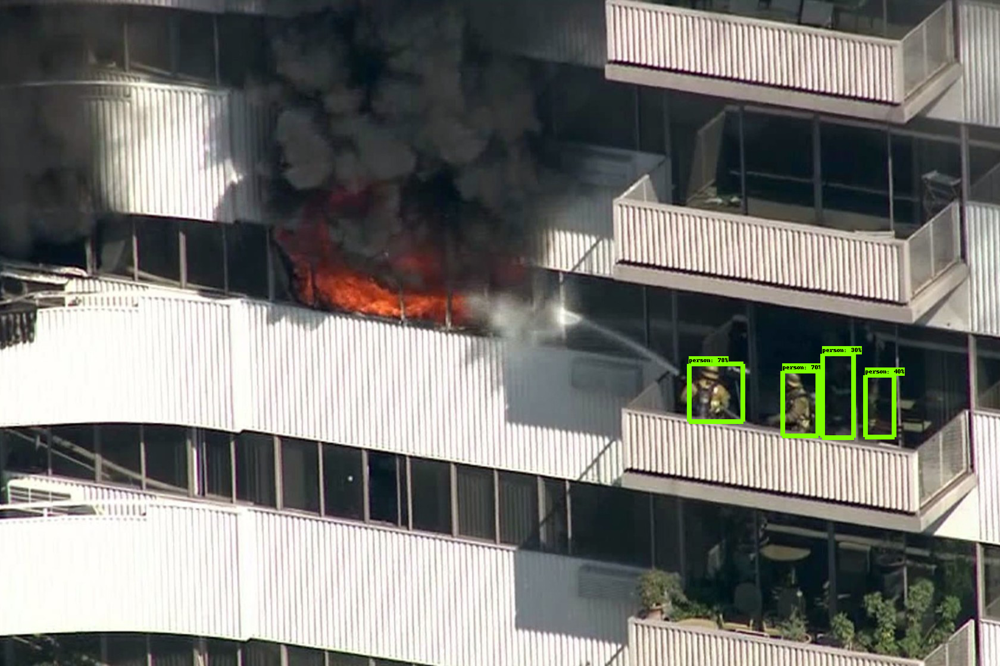

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores [0.8337177  0.4584789  0.34813142]
ss detection_classes [ 1 10 10]
ss detection_boxes [[0.46313685 0.9301802  0.61755043 0.9738004 ]
 [0.5584276  0.7064554  0.62512136 0.7199681 ]
 [0.5592014  0.7031326  0.62556106 0.71565336]]
ss num_detections 3


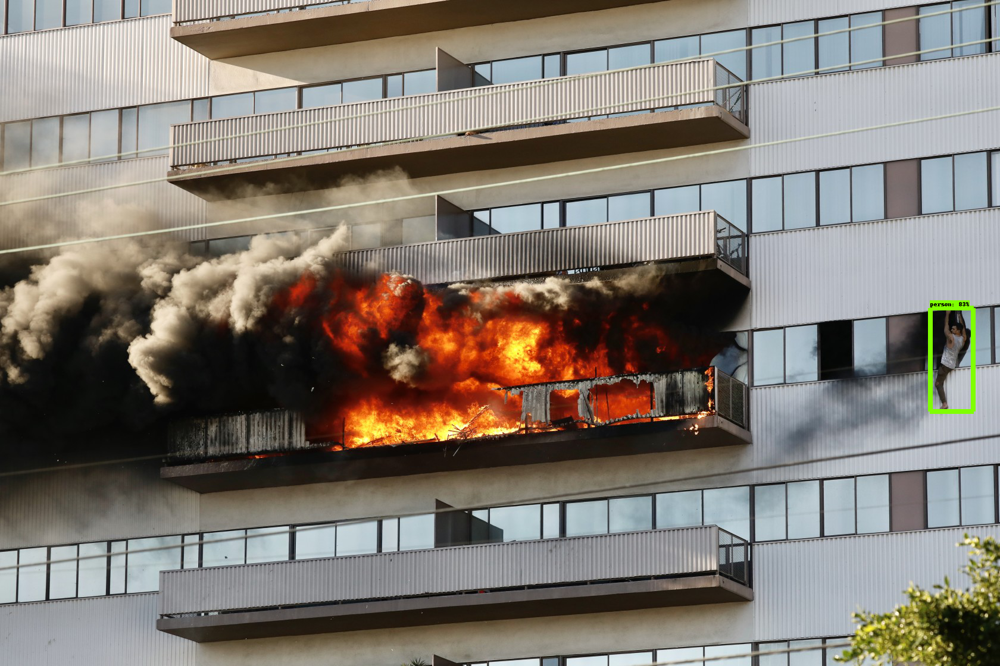

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores [0.86178887 0.5919348  0.5072337  0.34091616 0.324771  ]
ss detection_classes [62  1  1  1 62]
ss detection_boxes [[0.44111755 0.73562807 0.68001753 0.82358557]
 [0.5657868  0.34929323 0.7066261  0.39024895]
 [0.5712031  0.34947053 0.66324097 0.38539827]
 [0.2557763  0.02255441 0.38754067 0.06648245]
 [0.45894673 0.7091315  0.6895687  0.7867358 ]]
ss num_detections 5


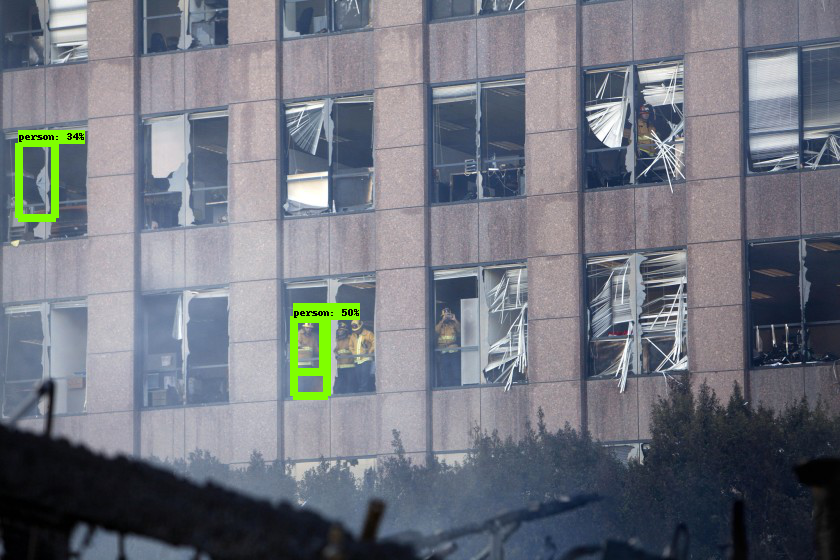

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores [0.998539]
ss detection_classes [1]
ss detection_boxes [[0.21091536 0.5320743  0.75717187 0.7034622 ]]
ss num_detections 1


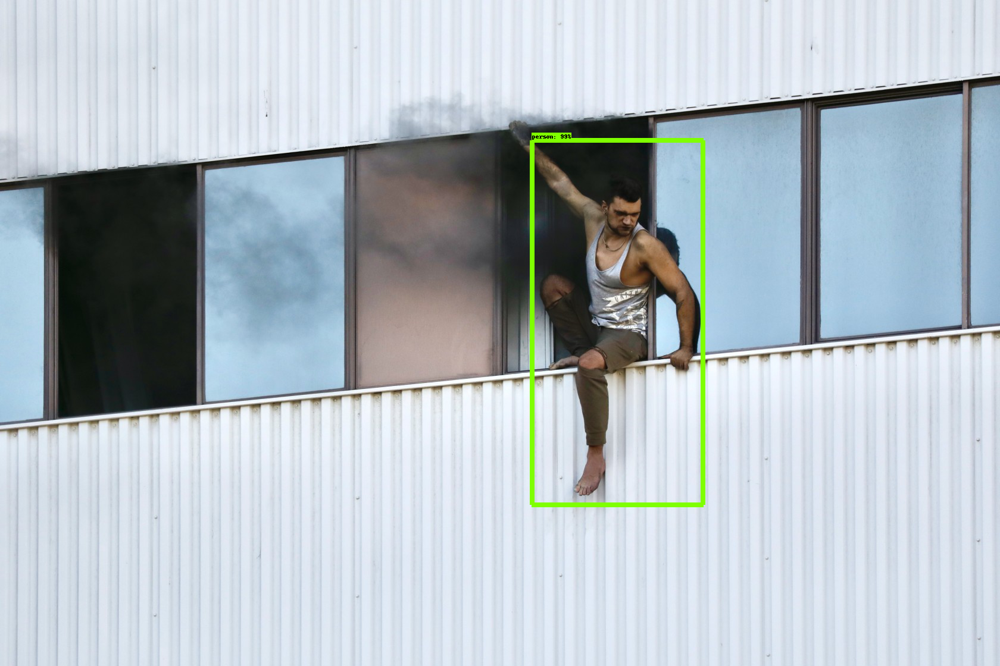

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores [0.9494763  0.9221979  0.7476677  0.59463114 0.3703334 ]
ss detection_classes [1 1 1 1 1]
ss detection_boxes [[0.52027595 0.29862258 0.7608737  0.3701991 ]
 [0.53821844 0.37768734 0.75918025 0.4655118 ]
 [0.5219856  0.5838961  0.60121024 0.632364  ]
 [0.52707297 0.505159   0.60162425 0.55216366]
 [0.52033293 0.30168575 0.61516184 0.36733302]]
ss num_detections 5


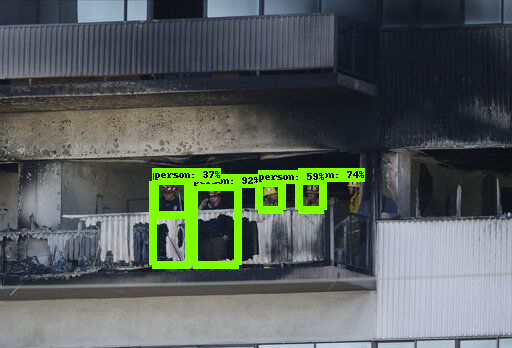

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores [0.9485543  0.8919822  0.3978046  0.3051712  0.30088228]
ss detection_classes [ 1  1 33  5  8]
ss detection_boxes [[0.50902903 0.58192235 0.9203699  0.88995683]
 [0.4875591  0.2401931  0.943614   0.49092326]
 [0.681939   0.3376203  0.9626742  0.5064769 ]
 [0.21468756 0.05973296 0.7922174  0.84628284]
 [0.3433517  0.1091315  0.98879987 0.8814437 ]]
ss num_detections 5


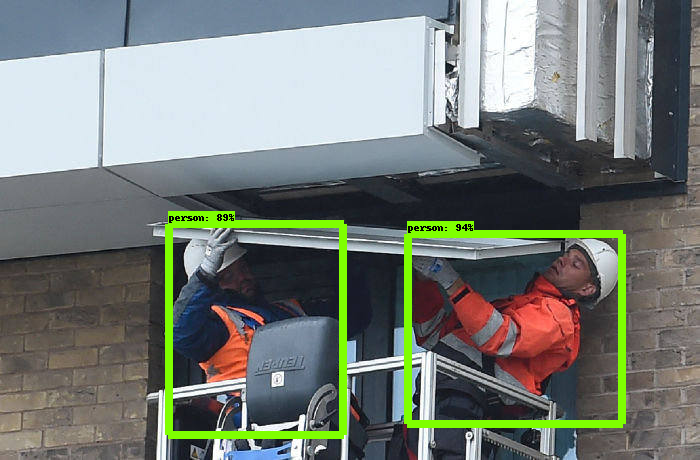

['result_10.jpeg', 'result_90-2.jpeg', 'result_90-6.jpeg', 'result_90-7.jpeg', 'result_90-9.jpeg', 'result_EP-301299928.jpg&updated=202001300116&MaxW=900&maxH=900&noborder&Q=80.jpeg', 'result_http---com.ft.imagepublish.upp-prod-us.s3.amazonaws.com-1f3f8b58-1daf-11ea-81f0-0c253907d3e0.jpeg', 'result_images-9.jpeg']
ss detection_scores [0.9032623  0.38621795]
ss detection_classes [1 7]
ss detection_boxes [[0.44741002 0.55753124 0.7291343  0.61436725]
 [0.08246124 0.16625646 0.9097796  1.        ]]
ss num_detections 2


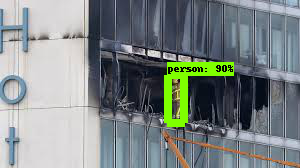

In [163]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('object_detection/test_images/close/')
output_path='object_detection/test_images/close_result'
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpeg")))
names=[str(i).split('/')[-1] for i in TEST_IMAGE_PATHS]
result_names=[f"result_{i}" for i in names]
print(result_names)
PATH_TO_LABELS = 'object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
for image_path in TEST_IMAGE_PATHS:
  show_inference(masking_model, image_path,output_path)

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores [0.81829643 0.561532   0.42590246 0.3320475 ]
ss detection_classes [59  1 18 82]
ss detection_boxes [[0.5449448  0.21351223 0.70187736 0.40487474]
 [0.04091514 0.08086108 0.7340383  0.778784  ]
 [0.08228341 0.0437251  0.7459276  0.8297211 ]
 [0.11888457 0.         0.95779485 0.6951835 ]]
ss num_detections 4


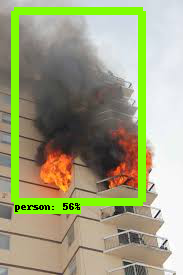

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores [0.4124209  0.34820768]
ss detection_classes [79  1]
ss detection_boxes [[0.05202145 0.1978055  0.9697769  0.74772155]
 [0.9285005  0.5057641  0.99377996 0.54342866]]
ss num_detections 2


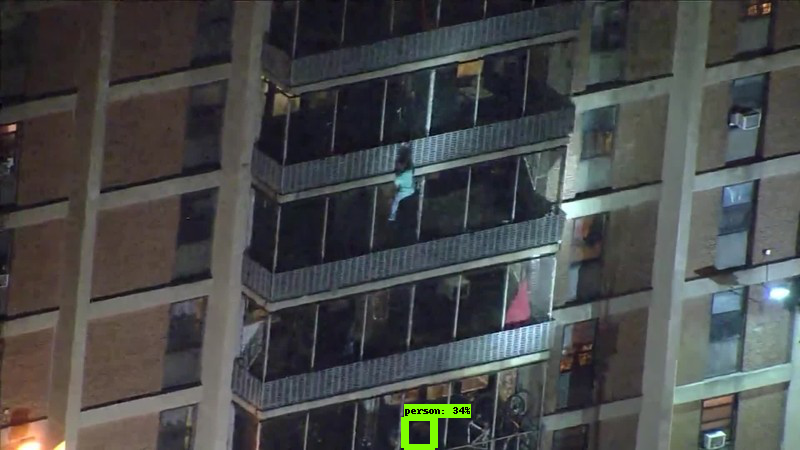

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores []
ss detection_classes []
ss detection_boxes []
ss num_detections 0


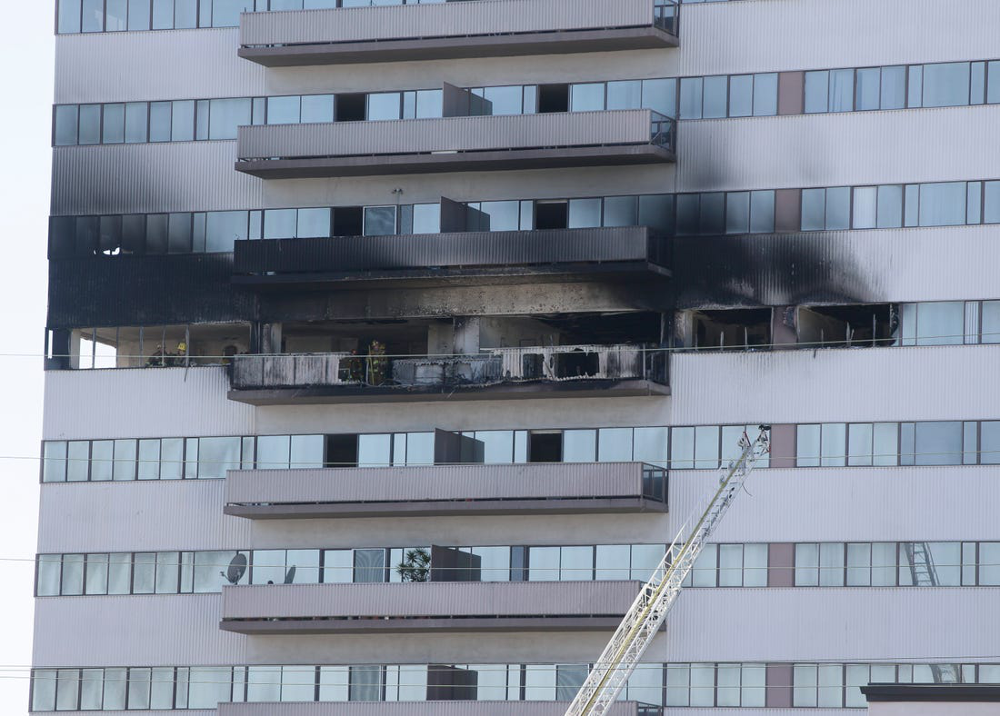

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores [0.5121945]
ss detection_classes [1]
ss detection_boxes [[0.2894594 0.6735813 0.3841861 0.7024372]]
ss num_detections 1


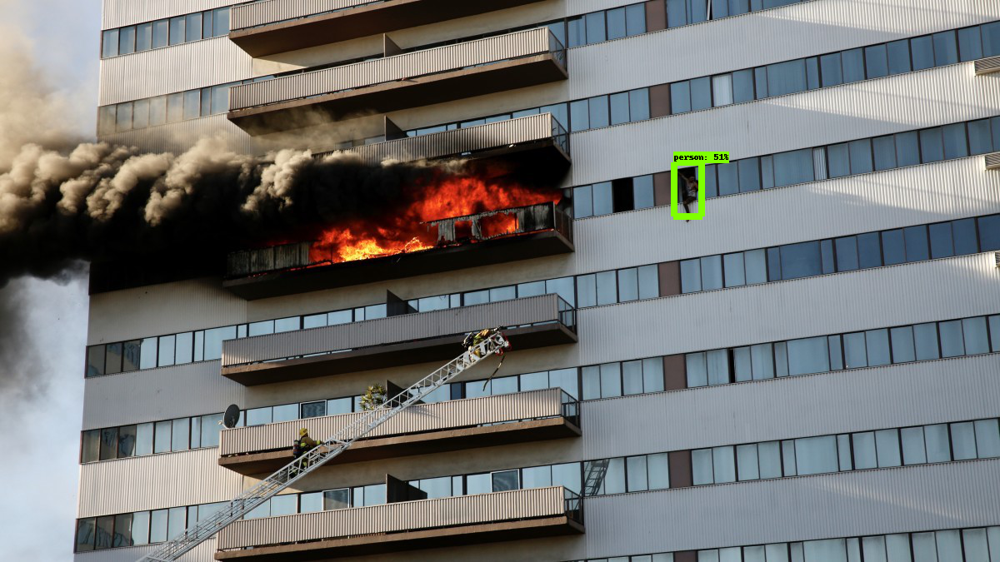

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores [0.3415234]
ss detection_classes [1]
ss detection_boxes [[0.9371268  0.70546556 0.9930379  0.73715174]]
ss num_detections 1


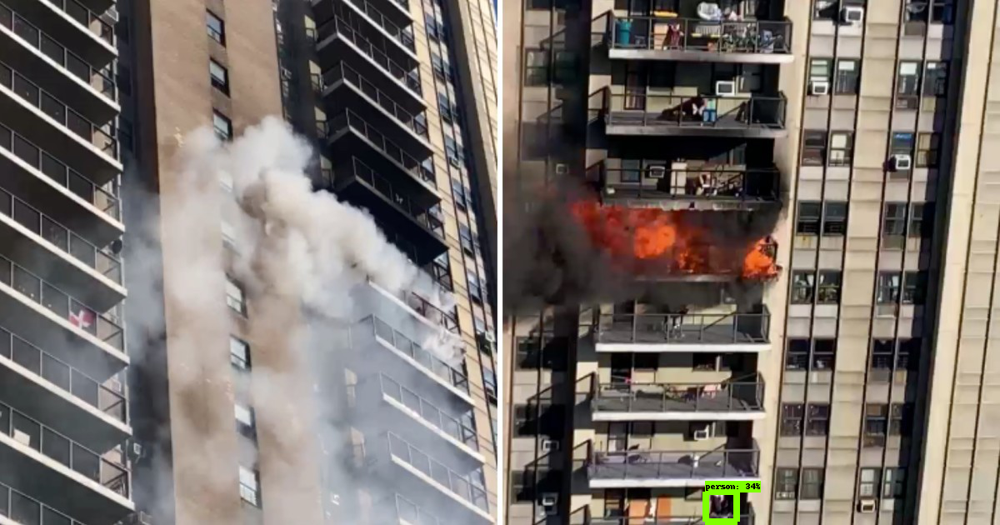

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores [0.67717993 0.3296749 ]
ss detection_classes [85  1]
ss detection_boxes [[0.36055592 0.2528304  0.40890247 0.27908266]
 [0.7913408  0.3522191  0.8305097  0.37206283]]
ss num_detections 2


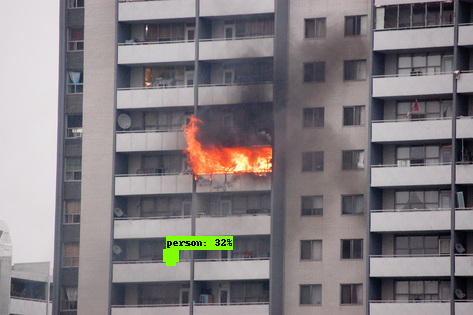

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores [0.8292162  0.80082446 0.49310833]
ss detection_classes [3 1 1]
ss detection_boxes [[0.9196255  0.68246824 0.9951261  0.9892147 ]
 [0.90599793 0.00475261 0.99865013 0.12050127]
 [0.91105044 0.4737197  0.99129224 0.5243892 ]]
ss num_detections 3


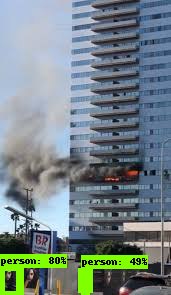

['result_3.jpeg', 'result_4704572.vpx.jpeg', 'result_5e327b895bc79c5ded443222.jpeg', 'result_90-5.jpeg', 'result_90-8.jpeg', 'result_fe83fdab42ea9d3ce9fc54a8c757.jpeg', 'result_images-10.jpeg', 'result_wellesley-fire-1.jpeg']
ss detection_scores []
ss detection_classes []
ss detection_boxes []
ss num_detections 0


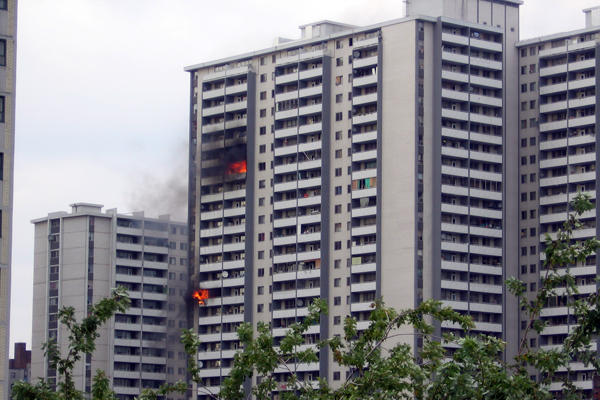

In [164]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('object_detection/test_images/far/')
output_path='object_detection/test_images/far_result'
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpeg")))
names=[str(i).split('/')[-1] for i in TEST_IMAGE_PATHS]
result_names=[f"result_{i}" for i in names]
PATH_TO_LABELS = 'object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
for image_path in TEST_IMAGE_PATHS:
  show_inference(masking_model, image_path,output_path)